**Author:** Elias Rafael Ruiz-Morales

**Institution:** Wellcome Sanger institute

**May, 2022**

Data clustering and broad annotation


----

# Notebook to perform the clustering analysis of the integrated data


In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import os
import sys
import anndata
import scvi


In [2]:
def MovePlots(plotpattern, subplotdir):
    os.system('mkdir -p '+str(sc.settings.figdir)+'/'+subplotdir)
    os.system('mv '+str(sc.settings.figdir)+'/*'+plotpattern+'** '+str(sc.settings.figdir)+'/'+subplotdir)

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.figdir = '../results/images/integrated/'
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80)  # low dpi (dots per inch) yields small inline figures

sys.executable

-----
anndata     0.7.5
scanpy      1.7.1
sinfo       0.3.1
-----
PIL                 8.1.2
absl                NA
anndata             0.7.5
anyio               NA
attr                20.3.0
babel               2.9.0
backcall            0.2.0
brotli              NA
cairo               1.20.0
certifi             2020.12.05
cffi                1.14.5
chardet             4.0.0
cloudpickle         1.6.0
colorama            0.4.4
cycler              0.10.0
cython_runtime      NA
cytoolz             0.11.0
dask                2021.03.1
dateutil            2.8.1
decorator           4.4.2
fsspec              0.8.7
get_version         2.1
google              NA
h5py                3.1.0
idna                2.10
igraph              0.8.3
ipykernel           5.5.0
ipython_genutils    0.2.0
ipywidgets          7.6.3
jedi                0.18.0
jinja2              2.11.3
joblib              1.0.1
json5               NA
jsonschema          3.2.0
jupyter_server      1.4.1
jupyterlab_server   2.3.0
kiw

'/opt/conda/bin/python'

In [3]:
adata = sc.read('../results/scVI/S2_scVIintegrated_adata_20220523.h5ad')
adata.X.shape

(196363, 32743)

In [32]:
adata

AnnData object with n_obs × n_vars = 196363 × 32743
    obs: 'sample', 'donor', 'termination', 'day', 'pcw', 'percent_mito', 'n_counts', 'batch', 'n_genes', 'sample_barcode', 'souporcell_id', 'donor_deconv', 'donor_souporcell', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'S_score', 'G2M_score', 'phase', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'scrublet_doublet', 'leiden_scvi'
    var: 'gene_ids', 'feature_types', 'n_cells'
    uns: '_scvi', 'donor_souporcell_colors', 'neighbors', 'umap', 'leiden', 'leiden_scvi_colors', 'day_colors', 'pcw_colors', 'scrublet_doublet_colors', 'sample_colors'
    obsm: 'X_scVI_n_latent_10', 'X_scVI_n_latent_20', 'X_scVI_n_latent_30', 'X_scVI_n_latent_40', '_scvi_extra_categoricals', 'X_umap'
    layers: 'raw_counts'
    obsp: 'distances', 'connectivities'

In [5]:
def doublet_assing(adata_obj, cell_id):
    
    '''
    Function that assigns the "doublet" label to the cells that were pooled
    
    input
        adata_obj: adata object
        cell_id: 

    '''
    
    #is_doublet label of the current cell, it's a boolean value
    curr_isDoublet = adata_obj.obs.loc[cell_id, 'is_doublet']


    #If the is_doublet is True, then the function willl return the "doublet"
    # Otherwise it will return the "singlet". 
    if curr_isDoublet == True:
        return("doublet")
    
    else:
        return("singlet")

    

In [6]:
adata.obs['scrublet_doublet'] = adata.obs['sample_barcode'].apply(lambda x: doublet_assing(adata,x))

In [7]:
adata.obs

,sample,donor,termination,day,pcw,percent_mito,n_counts,batch,n_genes,sample_barcode,...,bonf_pval,is_doublet,S_score,G2M_score,phase,_scvi_batch,_scvi_labels,_scvi_local_l_mean,_scvi_local_l_var,scrublet_doublet
Pla_HDBR10917729_AAACCCACATCGAACT,Pla_HDBR10917729,Hrv97,medical,d5,5pcw,0.004617,6715.0,0,1938,Pla_HDBR10917729_AAACCCACATCGAACT,...,1.0,False,0.145270,-0.228714,S,0,0,9.330803,1.336784,singlet
Pla_HDBR10917729_AAACCCAGTAAGACCG,Pla_HDBR10917729,Hrv97,medical,d5,5pcw,0.008159,858.0,0,449,Pla_HDBR10917729_AAACCCAGTAAGACCG,...,1.0,False,0.136907,0.299731,G2M,0,0,9.330803,1.336784,singlet
Pla_HDBR10917729_AAACCCAGTGGGATTG,Pla_HDBR10917729,Hrv97,medical,d5,5pcw,0.005693,1581.0,0,779,Pla_HDBR10917729_AAACCCAGTGGGATTG,...,1.0,False,0.025165,-0.084019,S,0,0,9.330803,1.336784,singlet
Pla_HDBR10917729_AAACGAAAGCCTAACT,Pla_HDBR10917729,Hrv97,medical,d5,5pcw,0.047304,3023.0,0,1178,Pla_HDBR10917729_AAACGAAAGCCTAACT,...,1.0,False,0.575056,0.865733,G2M,0,0,9.330803,1.336784,singlet
Pla_HDBR10917729_AAACGAAAGCCTGGAA,Pla_HDBR10917729,Hrv97,medical,d5,5pcw,0.066152,11005.0,0,3605,Pla_HDBR10917729_AAACGAAAGCCTGGAA,...,1.0,False,0.062936,-0.146854,S,0,0,9.330803,1.336784,singlet
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Pla_HDBR12808831_TTTGTTGTCCAAGAGG,Pla_HDBR12808831,Hrv141+Hrv142,surgical,d2,12pcw,0.077964,14404.0,15,4058,Pla_HDBR12808831_TTTGTTGTCCAAGAGG,...,NaN,False,-0.045314,0.148042,G2M,9,0,9.661806,0.781609,singlet
Pla_HDBR12808831_TTTGTTGTCGGTCATA,Pla_HDBR12808831,Hrv141+Hrv142,surgical,d2,14pcw_12pcw,0.046711,4089.0,15,1990,Pla_HDBR12808831_TTTGTTGTCGGTCATA,...,NaN,False,-0.222882,-0.077481,G1,10,0,8.367895,1.430727,singlet
Pla_HDBR12808831_TTTGTTGTCTCGACGG,Pla_HDBR12808831,Hrv141+Hrv142,surgical,d2,12pcw,0.021751,19355.0,15,4116,Pla_HDBR12808831_TTTGTTGTCTCGACGG,...,NaN,False,-0.086242,-0.144484,G1,9,0,9.661806,0.781609,singlet
Pla_HDBR12808831_TTTGTTGTCTGTGCTC,Pla_HDBR12808831,Hrv141+Hrv142,surgical,d2,14pcw,0.039958,23550.0,15,5239,Pla_HDBR12808831_TTTGTTGTCTGTGCTC,...,NaN,False,-0.157663,-0.152948,G1,8,0,9.532544,1.064018,singlet


In [9]:
sc.pp.neighbors(adata, n_neighbors=20, use_rep="X_scVI_n_latent_10")
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added="leiden_scvi", resolution=0.3)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:59)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:33)
running Leiden clustering
    finished: found 20 clusters and added
    'leiden_scvi', the cluster labels (adata.obs, categorical) (0:01:15)


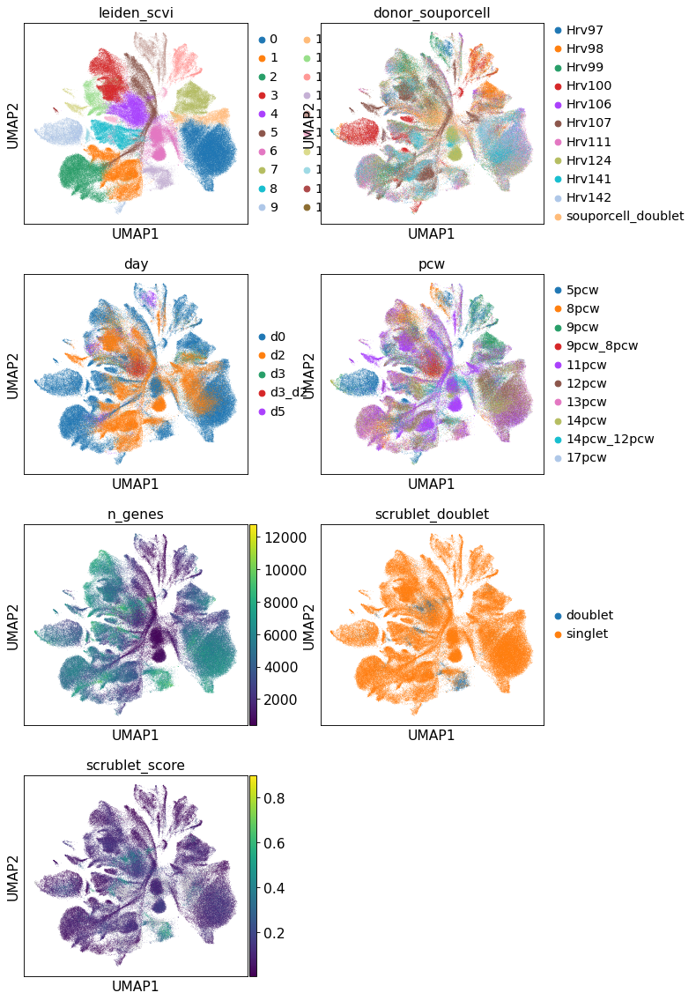

In [10]:
# use scVI imputed values for plotting
sc.pl.umap(adata, color=["leiden_scvi",'donor_souporcell', 'day','pcw',
                         'n_genes', 'scrublet_doublet','scrublet_score' ],
           ncols=2, save='_scVI_latent10.pdf')

In [11]:
#LATENT 20
sc.pp.neighbors(adata, n_neighbors=20, use_rep="X_scVI_n_latent_20")
sc.tl.umap(adata)

#clustering
sc.tl.leiden(adata, key_added="leiden_scvi", resolution=0.3)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:34)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:29)
running Leiden clustering
    finished: found 20 clusters and added
    'leiden_scvi', the cluster labels (adata.obs, categorical) (0:01:19)


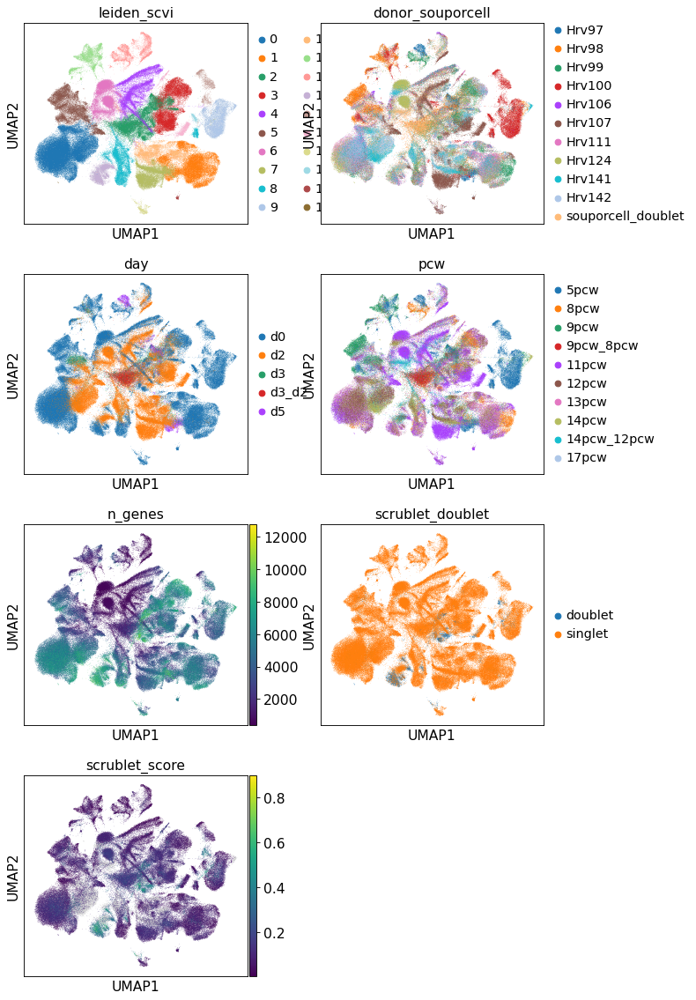

In [12]:
# use scVI imputed values for plotting
sc.pl.umap(adata, color=["leiden_scvi",'donor_souporcell', 'day','pcw',
                         'n_genes', 'scrublet_doublet','scrublet_score' ], 
           ncols=2, save='_scVI_latent20.pdf')

In [13]:
#LATENT 30
sc.pp.neighbors(adata, n_neighbors=20, use_rep="X_scVI_n_latent_30")
sc.tl.umap(adata)

#clustering
sc.tl.leiden(adata, key_added="leiden_scvi", resolution=0.3)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:34)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:38)
running Leiden clustering
    finished: found 18 clusters and added
    'leiden_scvi', the cluster labels (adata.obs, categorical) (0:01:09)


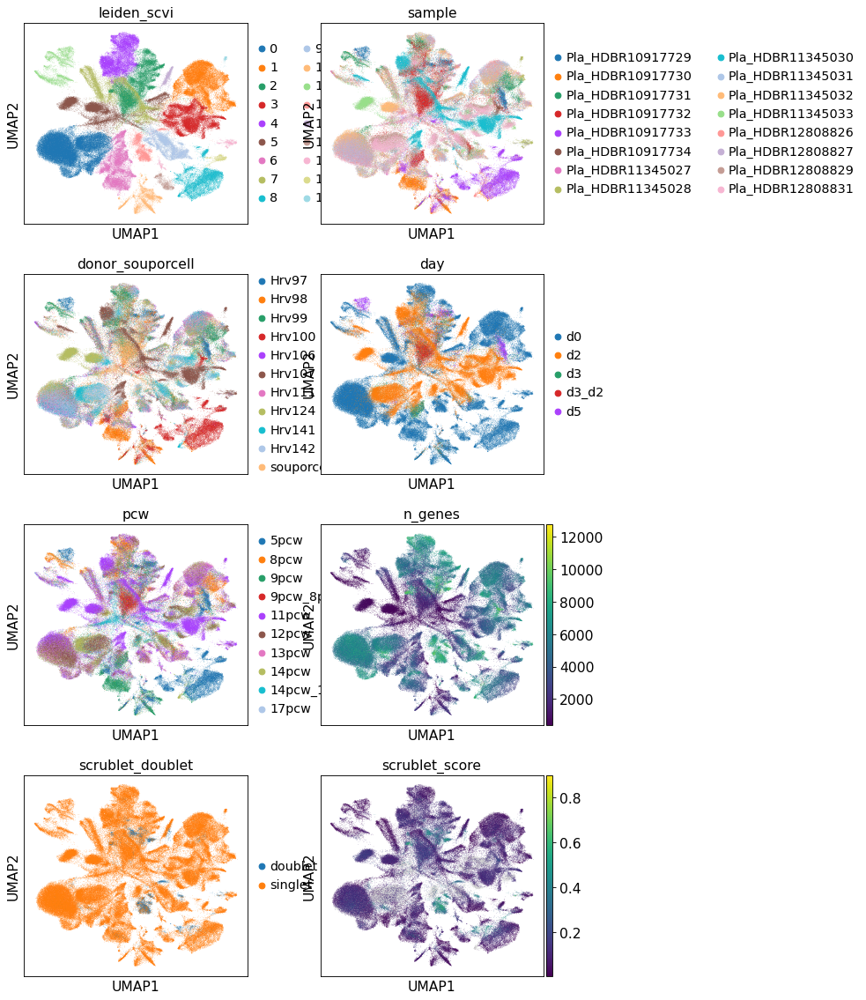

In [14]:
# use scVI imputed values for plotting
sc.pl.umap(adata, color=["leiden_scvi",'sample','donor_souporcell', 
                         'day','pcw','n_genes','scrublet_doublet','scrublet_score' ],
           ncols=2, save='_scVI_latent30.pdf')

In [15]:
#LATENT 40
sc.pp.neighbors(adata, n_neighbors=20, use_rep="X_scVI_n_latent_40")
sc.tl.umap(adata)

#clustering
sc.tl.leiden(adata, key_added="leiden_scvi", resolution=0.3)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:33)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:39)
running Leiden clustering
    finished: found 22 clusters and added
    'leiden_scvi', the cluster labels (adata.obs, categorical) (0:02:05)


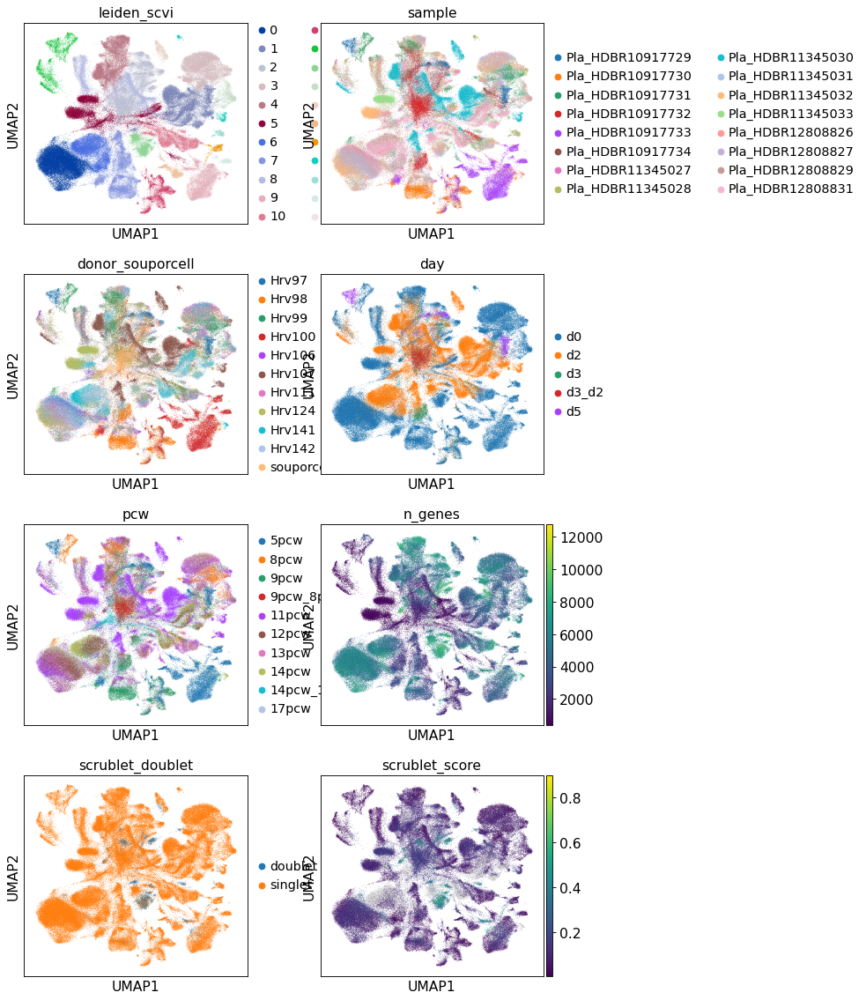

In [16]:
# use scVI imputed values for plotting
sc.pl.umap(adata, color=["leiden_scvi",'sample','donor_souporcell', 'day','pcw'
                         ,'n_genes','scrublet_doublet','scrublet_score' ],
           ncols=2, save='_scVI_latent40.pdf')

In [18]:
sc.pp.neighbors(adata, n_neighbors=20, use_rep="X_scVI_n_latent_30")
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added="leiden_scvi", resolution=0.3)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:33)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:36)
running Leiden clustering
    finished: found 18 clusters and added
    'leiden_scvi', the cluster labels (adata.obs, categorical) (0:01:02)


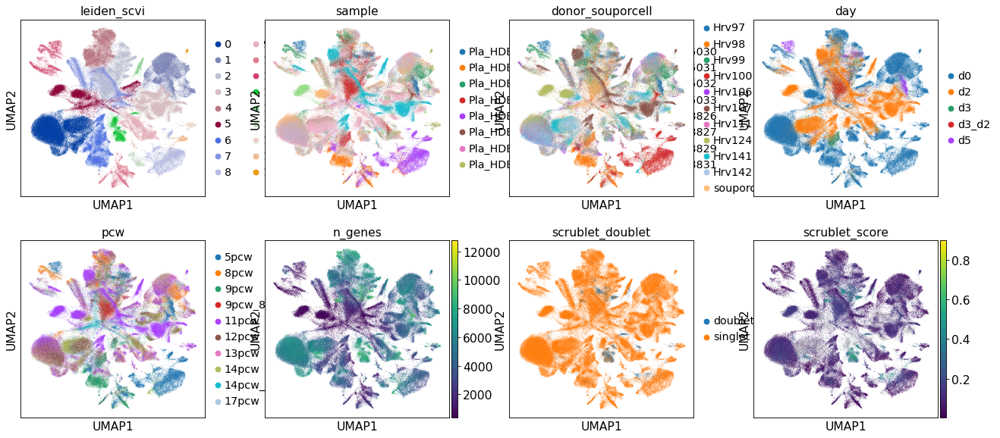

In [20]:
# use scVI imputed values for plotting
sc.pl.umap(adata, color=["leiden_scvi",'sample','donor_souporcell', 
                         'day','pcw','n_genes','scrublet_doublet','scrublet_score' ])

### Saving the object with use_rep="X_scVI_n_latent_30"

In [21]:
adata.write('../results/scVI/S2_scVIintegrated_adata_latent30_20220523.h5ad')

In [26]:
#adata= sc.read('../results/scVI/S2_scVIintegrated_adata_latent30_20220523.h5ad')

### Marker plots

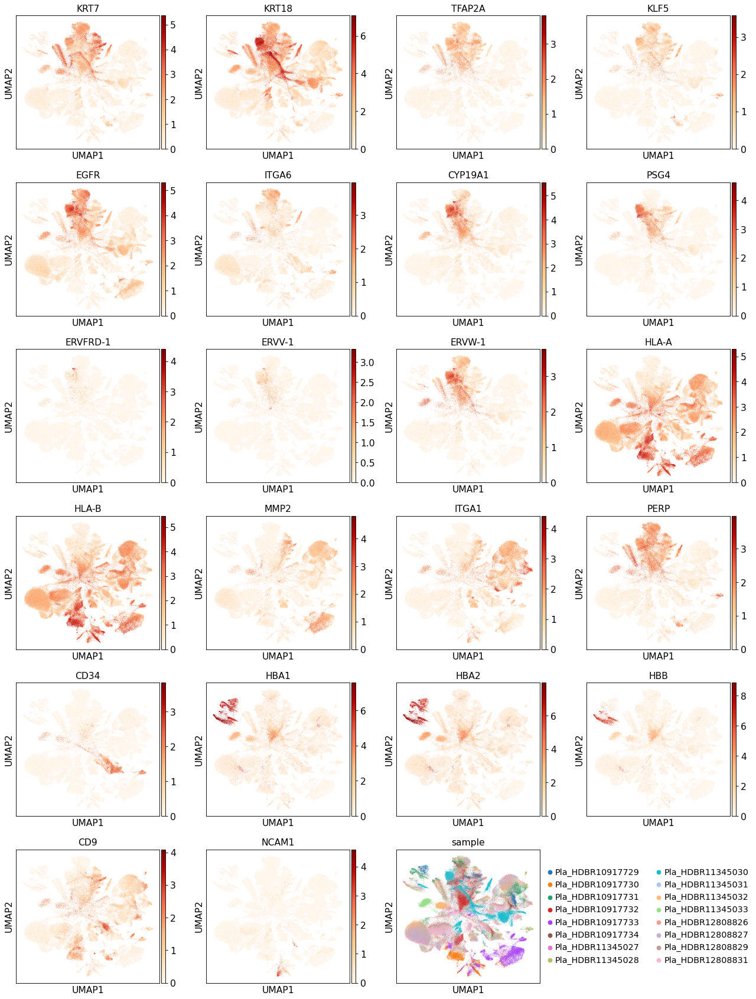

In [22]:
sc.pl.umap(adata, color=['KRT7','KRT18', 'TFAP2A', 'KLF5', 'EGFR' ,'ITGA6', 'CYP19A1','PSG4','ERVFRD-1', 'ERVV-1', 'ERVW-1', 
                         'HLA-A','HLA-B', 'MMP2', 'ITGA1', 'PERP', 'CD34', 'HBA1','HBA2','HBB',
                         'CD9','NCAM1','sample'],color_map='OrRd', save='_otherMarkers_scVI_latent30.pdf')

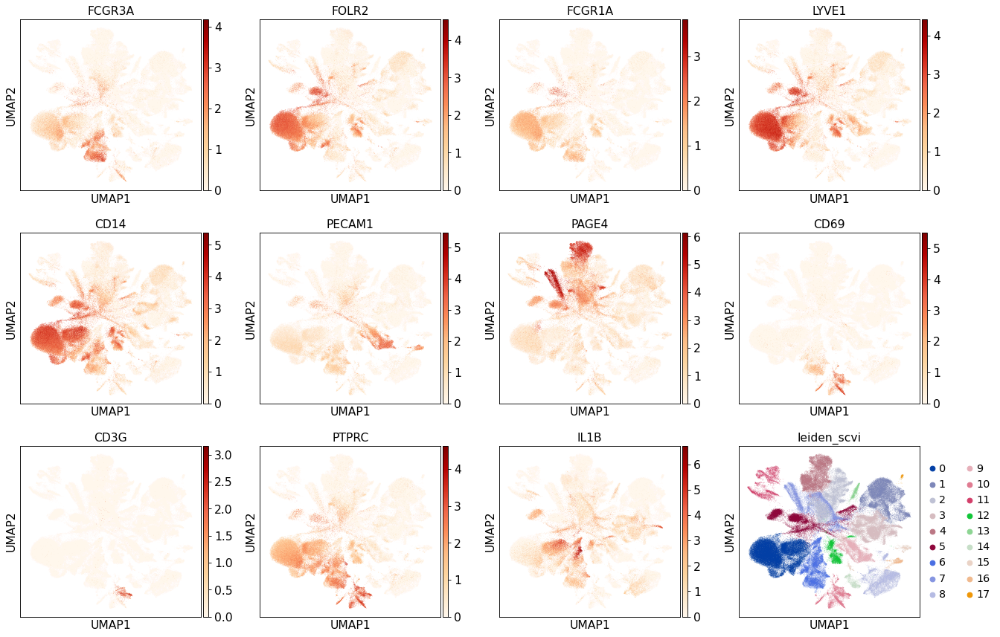

In [23]:
sc.pl.umap(adata, color=['FCGR3A', 'FOLR2', 'FCGR1A', 'LYVE1', 'CD14','PECAM1','PAGE4',
                         'CD69', 'CD3G','PTPRC','IL1B','leiden_scvi'],color_map='OrRd', save='_placentaImmuneMarkers_scVI_latent30.pdf')

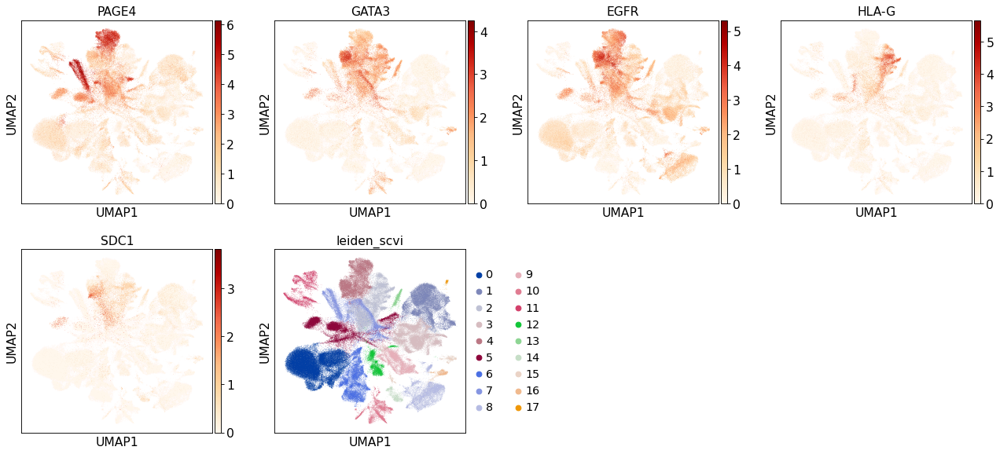

In [24]:
sc.pl.umap(adata, color=['PAGE4', 'GATA3', 'EGFR', 'HLA-G','SDC1','leiden_scvi']
           ,color_map='OrRd', save='_trophoblastMarkers_scVI_latent30.pdf')

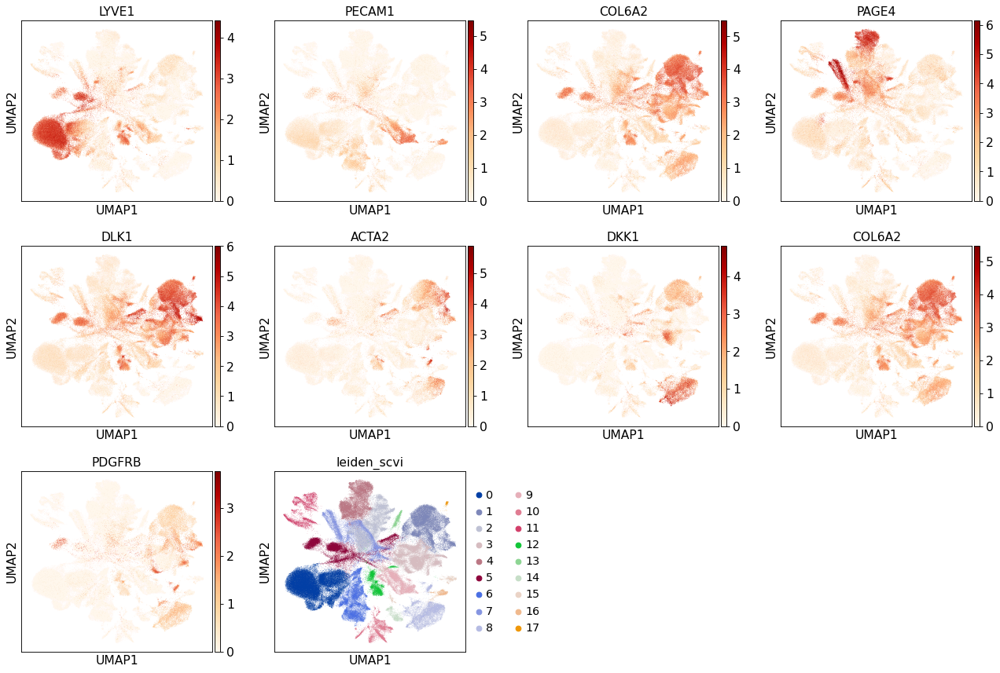

In [25]:
sc.pl.umap(adata, color=['LYVE1', 'PECAM1', 'COL6A2', 'PAGE4',
                        'DLK1', 'ACTA2','DKK1', 'COL6A2','PDGFRB', 'leiden_scvi'],color_map='OrRd', save='_placentaMarkers_scVI_latent30.pdf')

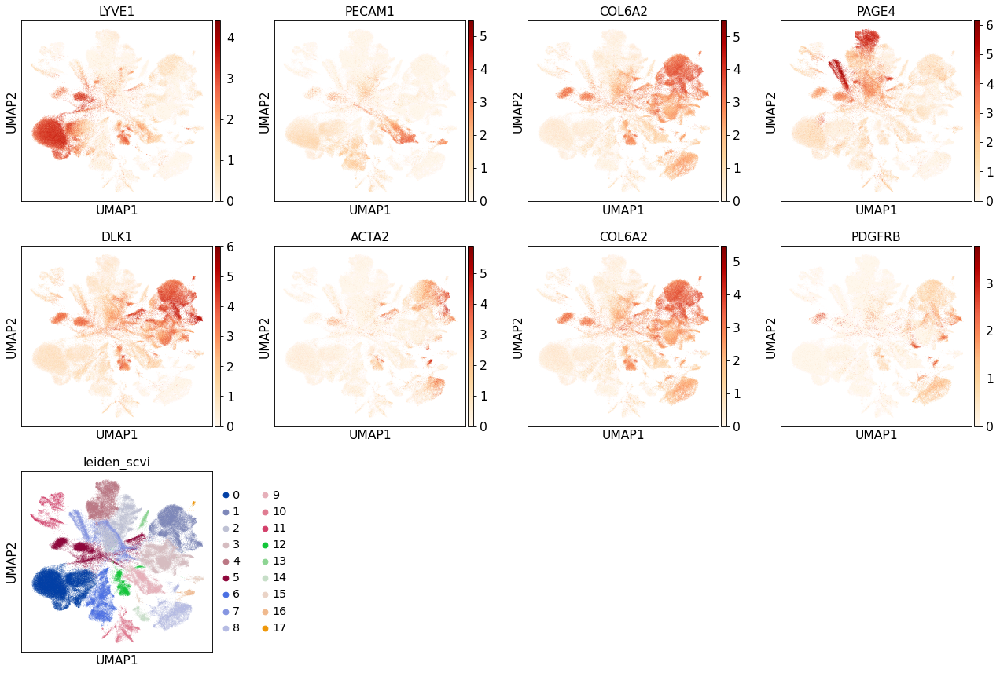

In [26]:
sc.pl.umap(adata, color=['LYVE1', 'PECAM1', 'COL6A2', 'PAGE4',
                        'DLK1', 'ACTA2', 'COL6A2','PDGFRB', 'leiden_scvi'],color_map='OrRd')

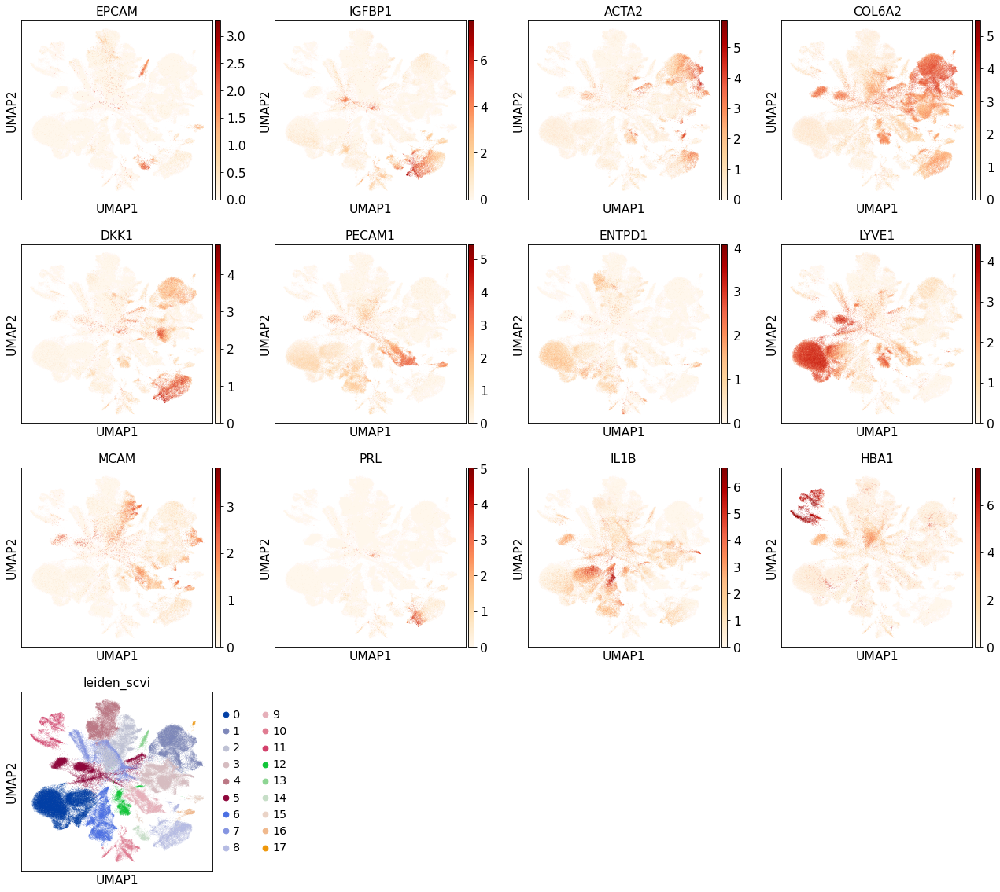

In [27]:
sc.pl.umap(adata, color=['EPCAM', 'IGFBP1', 'ACTA2', 'COL6A2', 'DKK1','PECAM1','ENTPD1', 'LYVE1', 'MCAM',
                         'PRL','IL1B','HBA1',''
                         'leiden_scvi'],color_map='OrRd', save='_deciduaMarkers_scVI_latent30.pdf')

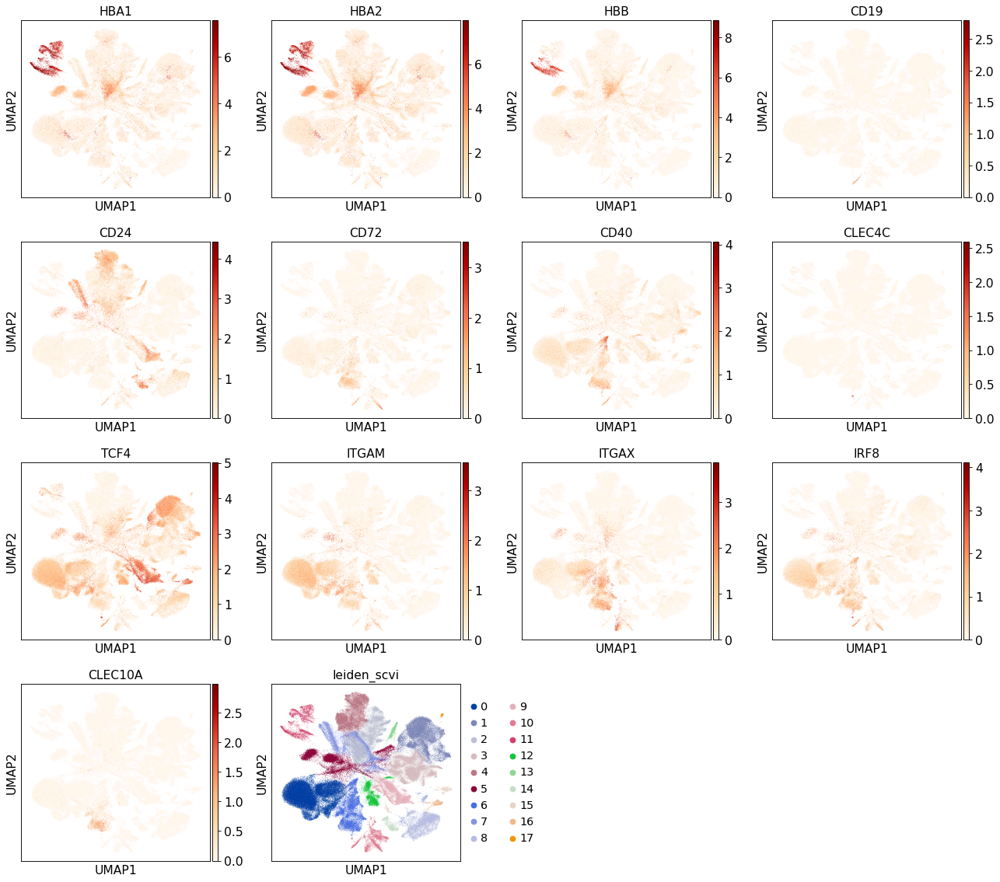

In [28]:
sc.pl.umap(adata, color=['HBA1','HBA2','HBB', #Erythrocyte
                         'CD19','CD24', 'CD72', #B cells
                         'CD40',#macrophage
                         'CLEC4C','TCF4','ITGAM','ITGAX','IRF8','CLEC10A', #DCs
                         'leiden_scvi'],color_map='OrRd')

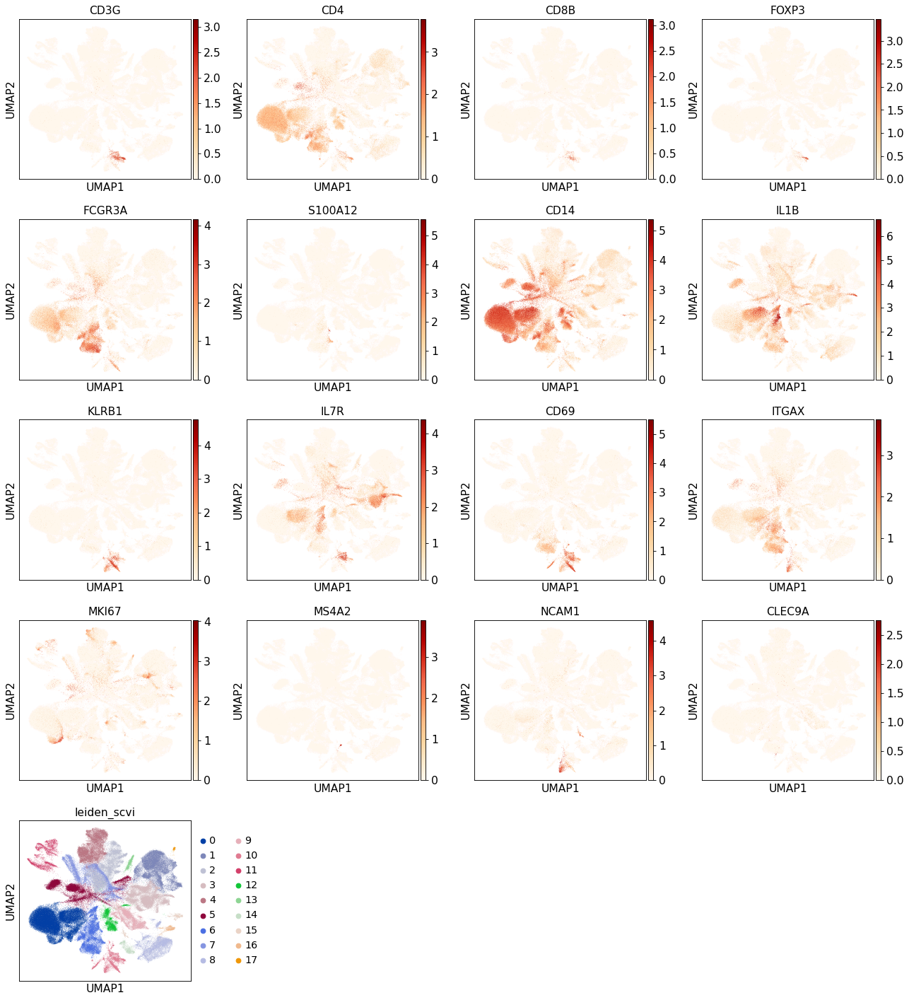

In [29]:
sc.pl.umap(adata, color=[ 'CD3G', 'CD4', 'CD8B', 'FOXP3', 'FCGR3A','S100A12','CD14','IL1B',
                         'KLRB1','IL7R','CD69','ITGAX','MKI67','MS4A2','NCAM1', 'CLEC9A',
                         'leiden_scvi'],color_map='OrRd', save='_deciduaImmuneMarkers_scVI_latent30.pdf')

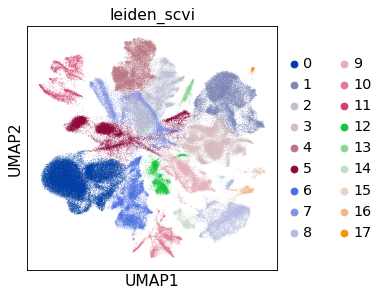

In [30]:

# use scVI imputed values for plotting
sc.pl.umap(adata, color=['leiden_scvi' ], ncols=2, save='_scVI_latent30_clusters.pdf')

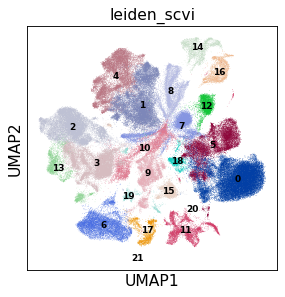

In [38]:

# use scVI imputed values for plotting
sc.pl.umap(adata, color=['leiden_scvi' ], legend_loc='on data',legend_fontsize='xx-small', save='_scVI_latent30_clusters2.pdf')

In [31]:
adata

AnnData object with n_obs × n_vars = 196363 × 32743
    obs: 'sample', 'donor', 'termination', 'day', 'pcw', 'percent_mito', 'n_counts', 'batch', 'n_genes', 'sample_barcode', 'souporcell_id', 'donor_deconv', 'donor_souporcell', 'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet', 'S_score', 'G2M_score', 'phase', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'scrublet_doublet', 'leiden_scvi'
    var: 'gene_ids', 'feature_types', 'n_cells'
    uns: '_scvi', 'donor_souporcell_colors', 'neighbors', 'umap', 'leiden', 'leiden_scvi_colors', 'day_colors', 'pcw_colors', 'scrublet_doublet_colors', 'sample_colors'
    obsm: 'X_scVI_n_latent_10', 'X_scVI_n_latent_20', 'X_scVI_n_latent_30', 'X_scVI_n_latent_40', '_scvi_extra_categoricals', 'X_umap'
    layers: 'raw_counts'
    obsp: 'distances', 'connectivities'